In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src, Plots, Plots.Measures

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [2]:
function save_all_fig(r, rf, path, pt::String)
    savefig(r.plot_mles[1], joinpath(path, "$(pt)_mle_restart_a.pdf"))
    if length(r.plot_mles) > 1
        savefig(r.plot_mles[2], joinpath(path, "$(pt)_mle_restart_m.pdf"))
    end
    savefig(r.plot_losses, joinpath(path, "$(pt)_losses.pdf"))
    savefig(r.gaussian_heatmap, joinpath(path, "$(pt)_gaussian_heatmap.pdf"))
    savefig(r.gaussian_surface[1], joinpath(path, "$(pt)_gaussian_surface_1.pdf"))
    savefig(r.gaussian_surface[2], joinpath(path, "$(pt)_gaussian_surface_2.pdf"))

    savefig(rf.trajectories, joinpath(path, "$(pt)_trajectories.pdf"))
    savefig(rf.sample_dens_n, joinpath(path, "$(pt)_dens_n.pdf"))
    savefig(rf.sample_dens_w, joinpath(path, "$(pt)_dens_w.pdf"))
end

save_all_fig (generic function with 1 method)

# Identifiability Analysis of Point in Parameter Region 1

p1 = [a,m,w0,n0] = [0.5,0.45,1.5,1.0]

In [3]:
# set true model parameters
a_true = 0.5 # left of bifurcation point
m_true = 0.45
n0_true = 1.5
w0 = 1.0
M = 100 # number of measurements
noise = 0.1

# create parameter object for trial
hprm = Hyperprm(w0, n0_true, a_true, m_true, M, noise);

## fixed time window, observe from t=0

In [4]:
# infer a,m parameter
prm_keys = [:a, :m]

# observation time window fixed
t_fixed = true

true

In [5]:
# inverse uq and practical identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.5086529953982879, 0.4594539142345193], plot_mles = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=6}, Plot{Plots.GRBackend() n=6}], plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.34047190764639307; 0.34047190764743707 1.0], cov = [0.0010707225081488558 0.00036487427367776676; 0.0003648742736788856 0.0010726227069842434], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=1}])

In [6]:
# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], hprm, t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

#### analyze plots

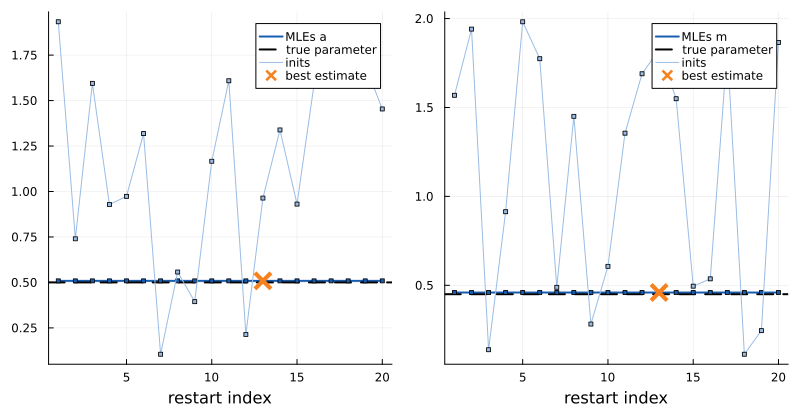

In [7]:
plot(r.plot_mles[1], r.plot_mles[2], layout=(1,2), size=(800,420), bottom_margin=5mm)

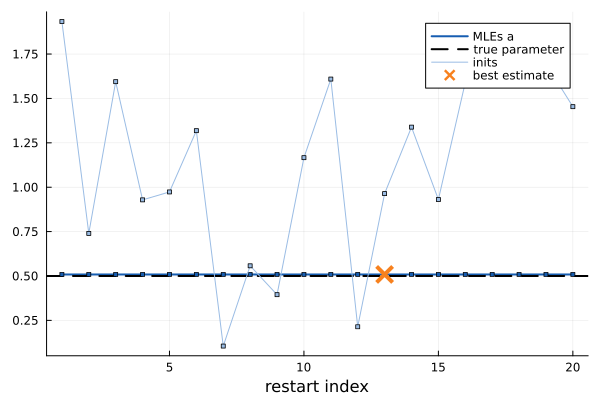

In [8]:
r.plot_mles[1]

MLE is very close to true value and MLE is found in every optimization restart. Apparently unique maximum exists.

In [9]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.340472
 0.340472  1.0

correlation of a and m is quite low, which is also depicted in the surface of the Gaussian.

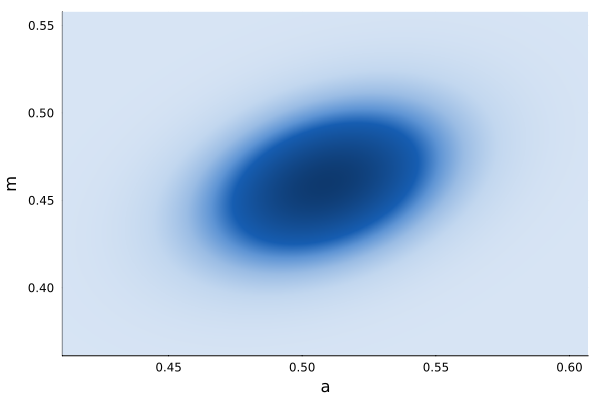

In [10]:
r.gaussian_heatmap

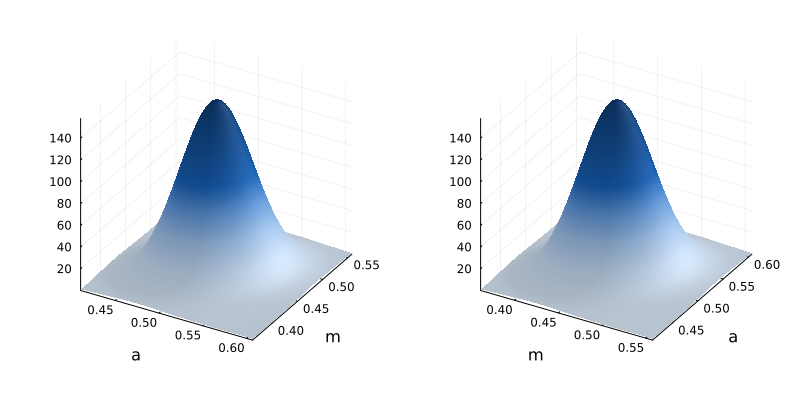

In [11]:
plot(r.gaussian_surface[1], r.gaussian_surface[2], layout=(1,2), size=(800,400))

The Gaussian is not largely skewed into any direction.

In [12]:
analyze_ll(r.mle, prm_keys, hprm, -1000, t_fixed=t_fixed, levels=800)
scatter!([a_true],[m_true], markershape=:x, markerstrokewidth=3, markersize=6, color="#FAD080", label="true")
savefig("C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt1/am/pt1_ll.pdf")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt1\\am\\pt1_ll.pdf"

The log-likelihood function has a clear optimum, which is found by the optimization algorithm.

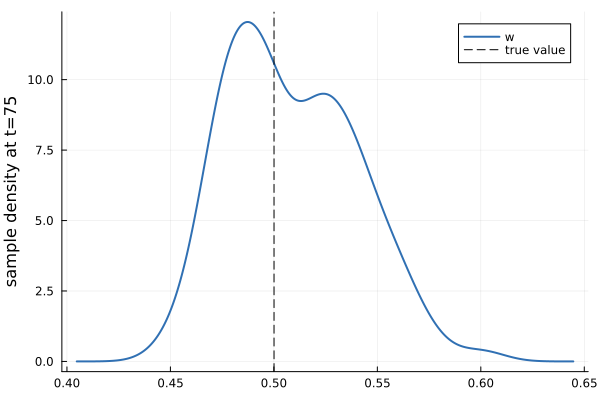

In [13]:
rf.sample_dens_w

Sample density concentrates around true w-compartment value.

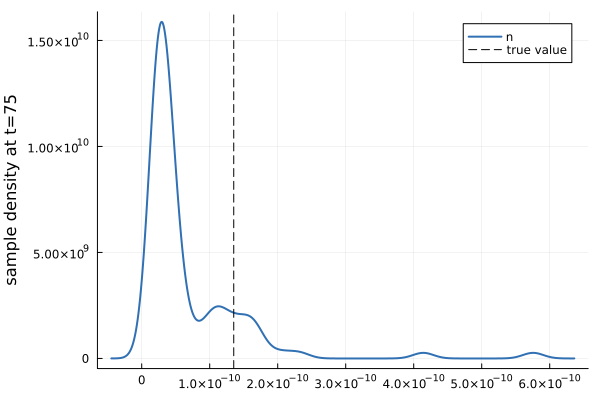

In [14]:
rf.sample_dens_n

Sample density seems a bit off, however the scale is very low. So, it concentrates around the true value of the n-compartment, which is zero.

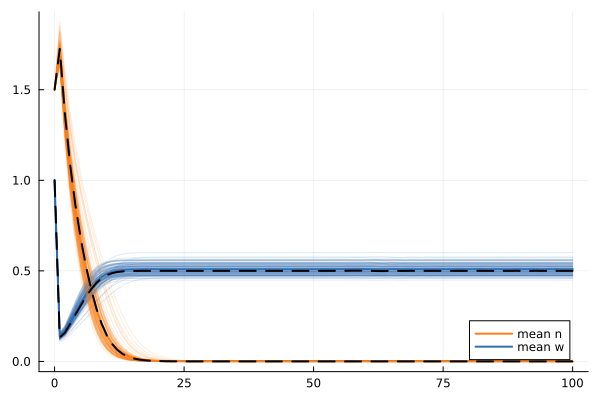

In [15]:
rf.trajectories

In [16]:
path = "C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt1/am/"
save_all_fig(r,rf,path,"pt1")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt1\\am\\pt1_dens_w.pdf"

Biomass converges to plant-free equlibrium, whilst water stabilized around value of water input parameter a.
The variability in stable state of w is higher than in n.

Conclusion: both a,m can be inferred

## fixed time window, observe in stable state only

In [3]:
# observation time window fixed
t_fixed = true

# observations in stable state only
obs_late = true
t_end = 200.0; # observe system for a longer time in this case

### infer a,m

In [18]:
# infer a,m parameter
prm_keys = [:a, :m];

In [19]:
# inverse uq and practica identifiability
rl = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

(mle = [0.5014327399251379, 0.3149360304412594], plot_mles = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=6}, Plot{Plots.GRBackend() n=6}], plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.0015738206755327006; 0.0015738206755315923 1.0], cov = [0.0019999998537341065 0.0006271302726200925; 0.0006271302726196509 79.39169498476296], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

In [17]:
rl.mle

2-element Vector{Float64}:
 0.5218619729917814
 0.2726503254327568

In [18]:
rl.cov # m will even become negative!

2×2 Matrix{Float64}:
 0.00199998   0.000926391
 0.000926391  0.0366211

Variance of m is so large, that forward UQ is not feasible. Absolute samples of values for m will be very large and m will also become negative.

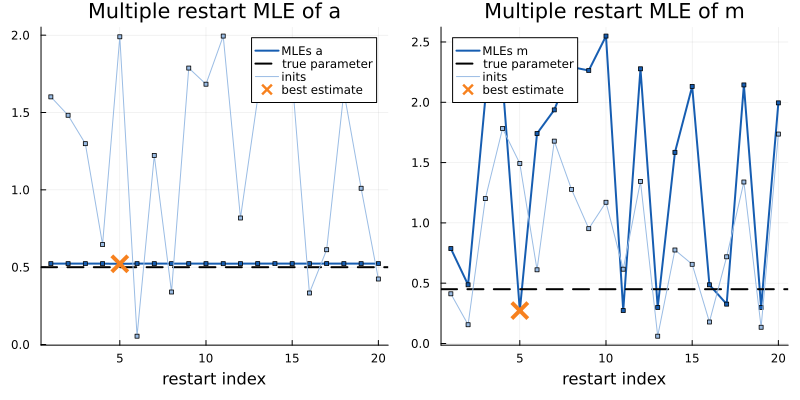

In [19]:
rl.plot_mles

apparently there are many local maxima for m

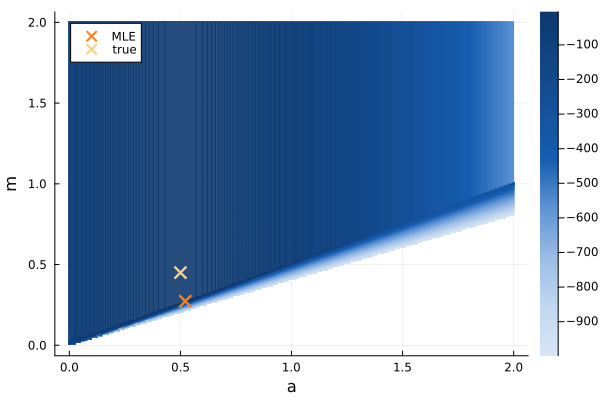

In [20]:
analyze_ll(rl.mle, prm_keys, hprm, -1000, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0, levels=800)
scatter!([a_true],[m_true], markershape=:x, markerstrokewidth=3, markersize=6, color="#FAD080", label="true")

likelihood is basically flat into m direction -> no unique maximum can be found.

Conclusion: a and m are not identifiable. -> try to infer only a.

### infer a

In [4]:
# infer a parameter
prm_keys = [:a];

In [5]:
# inverse uq and practica identifiability
rl = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

(mle = [0.492291419314023], plot_mles = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=6}], plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0;;], cov = [0.0020000015820912185;;], gaussian_heatmap = nothing, gaussian_surface = Plot{Plots.GRBackend() n=1})

In [6]:
# forward uq
rlf = forward_uq(rl.mle, rl.cov, prm_keys, [a_true], hprm, t_fixed=t_fixed, t_end=t_end, t_pt_sample_dens=25)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [7]:
rl.cov

1×1 Matrix{Float64}:
 0.0020000015820912185

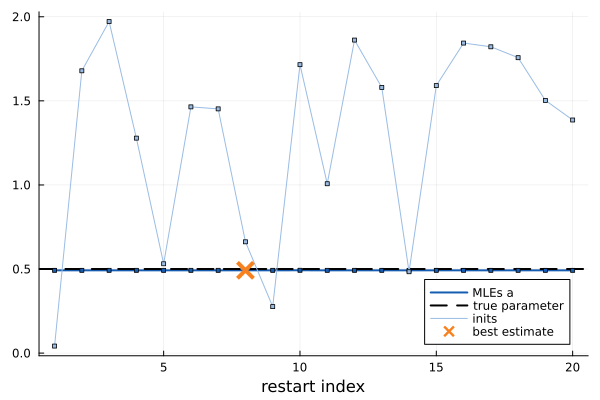

In [8]:
rl.plot_mles[1]

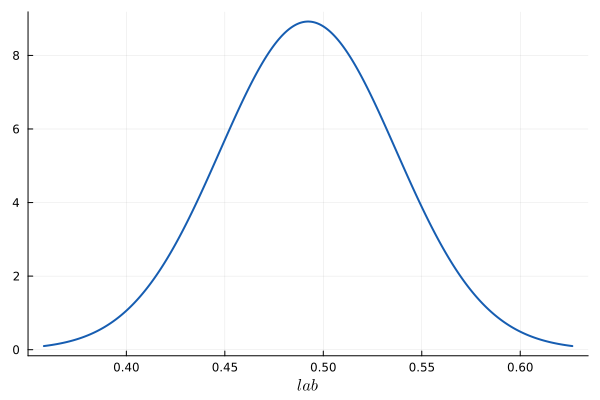

In [9]:
rl.gaussian_surface

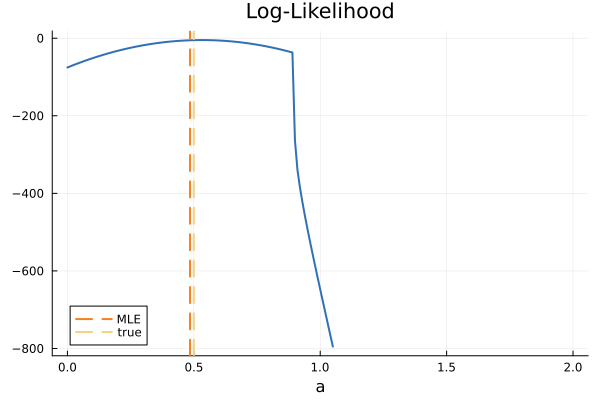

In [27]:
analyze_ll(rl.mle, prm_keys, hprm, -800, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0)
vline!([a_true], linestyle=:dash, linewidth=2, color=:"#FAD080", label="true")

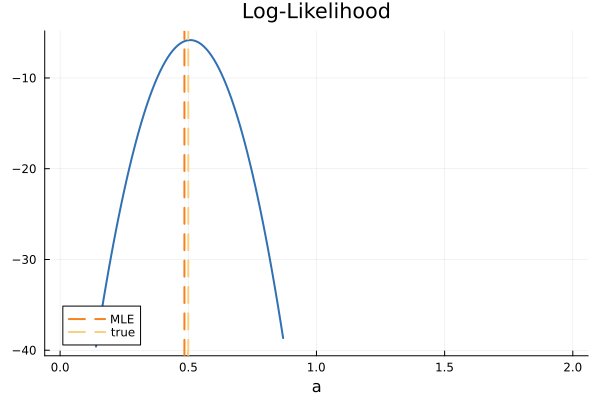

In [28]:
analyze_ll(rl.mle, prm_keys, hprm, -40, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0)
vline!([a_true], linestyle=:dash, linewidth=2, color=:"#FAD080", label="true")

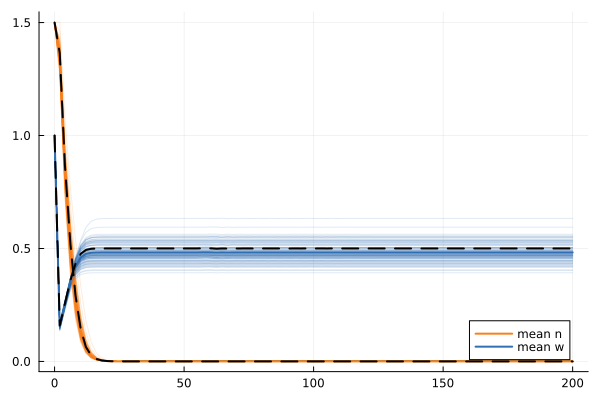

In [29]:
rlf.trajectories

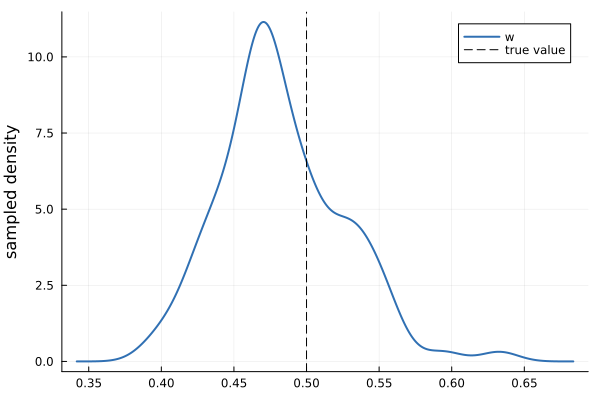

In [30]:
rlf.sample_dens_w